# Impor Library

In [2]:
import os
import random
import shutil
import pathlib
import glob
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
import cv2
import gdown
import absl.logging
import logging

!pip install opendatasets
import opendatasets as od

warnings.filterwarnings('ignore')

!pip install tensorflowjs
import tensorflow as tf
import tensorflowjs as tfjs
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, Dropout, Dense,
    GlobalAveragePooling2D, BatchNormalization
)

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetV2B0, MobileNetV2
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.1 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
google-cloud-bigquery 3.33.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


#Load Dataset

In [3]:
od.download(
    "https://www.kaggle.com/datasets/arghianfaizalyusup/dataset-penyakit-kulit")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: hentaligagaga
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/arghianfaizalyusup/dataset-penyakit-kulit


100%|██████████| 304M/304M [00:00<00:00, 337MB/s]


In [4]:
dataset_path = '/content/dataset-penyakit-kulit/Dataset'
os.listdir(dataset_path)

['Melanoma Skin Cancer Nevi',
 'Disorders of Pigmentation',
 'Lupus',
 'Poison Ivy and Contact Dermatitis',
 'Vasculitis',
 'Psoriasis pictures Lichen Planus',
 'Herpes HPV',
 'Vascular Tumors',
 'Cellulitis Impetigo',
 'Seborrheic Keratoses',
 'Ringworm',
 'Cutaneous Larva Migrans',
 'Systemic Disease',
 'Exanthems',
 'Tinea Ringworm Candidiasis',
 'Normal',
 'Acne and Rosacea',
 'Nail Fungus',
 'Urticaria Hives',
 'Atopic Dermatitis',
 'Chickenpox',
 'Shingles',
 'Athlete Foot',
 'Actinic Keratosis Basal Cell Carcinoma',
 'Warts Molluscum and other Viral Infections',
 'Eczema']

# Data Preparation

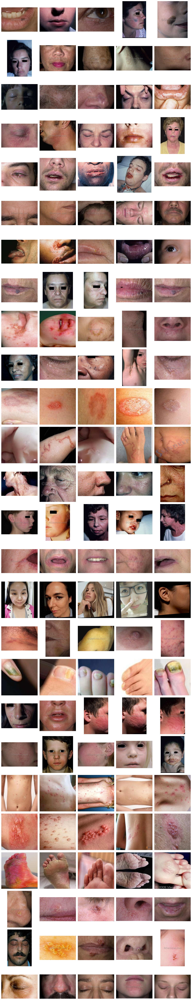

In [5]:
lung_image = {}

# Path dataset gabungan
path_sub = "/content/dataset-penyakit-kulit/Dataset"

# Ambil daftar file gambar per kelas di folder combined
for category in os.listdir(path_sub):
    class_path = os.path.join(path_sub, category)
    if os.path.isdir(class_path):
        lung_image[category] = os.listdir(class_path)

# Plot 5 gambar random per kelas
fig, axs = plt.subplots(len(lung_image), 5, figsize=(15, 3 * len(lung_image)))

for i, class_name in enumerate(lung_image):
    images = lung_image[class_name]
    sample_images = np.random.choice(images, min(len(images), 5), replace=False)

    for j in range(5):
        axs[i, j].axis('off')
        if j < len(sample_images):
            img_path = os.path.join(path_sub, class_name, sample_images[j])
            img = Image.open(img_path).convert("RGB")
            axs[i, j].imshow(img)
        if j == 0:
            axs[i, j].set_ylabel(class_name, size='large')

plt.tight_layout()
plt.show()

# Data Preprocessing

#Exploratory Data Analysis

In [6]:
# Bikin folder baru buat split ulang
split_base = 'dataset_split'
for split in ['train', 'val', 'test']:
    for class_name in os.listdir(path_sub):
        os.makedirs(os.path.join(split_base, split, class_name), exist_ok=True)

# Parameter split
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Split dan salin file
for class_name in os.listdir(path_sub):
    class_dir = os.path.join(path_sub, class_name)

    if not os.path.isdir(class_dir):
        continue

    images = os.listdir(class_dir)
    random.shuffle(images)

    total = len(images)
    train_end = int(train_ratio * total)
    val_end = train_end + int(val_ratio * total)

    train_imgs = images[:train_end]
    val_imgs = images[train_end:val_end]
    test_imgs = images[val_end:]

    for img in train_imgs:
        shutil.copy2(os.path.join(class_dir, img), os.path.join(split_base, 'train', class_name, img))
    for img in val_imgs:
        shutil.copy2(os.path.join(class_dir, img), os.path.join(split_base, 'val', class_name, img))
    for img in test_imgs:
        shutil.copy2(os.path.join(class_dir, img), os.path.join(split_base, 'test', class_name, img))

print("Dataset successfully re-split into train, val, and test.")

Dataset successfully re-split into train, val, and test.


In [4]:
'''# ImageDataGenerator untuk augmentasi dan normalisasi
datagen = ImageDataGenerator(
    rescale=1./255,      # Normalisasi
    rotation_range=20,    # Rotasi gambar
    width_shift_range=0.2, # Pergeseran horizontal
    height_shift_range=0.2,# Pergeseran vertikal
    shear_range=0.2,      # Distorsi
    zoom_range=0.2,       # Zoom
    horizontal_flip=True, # Flip horizontal
    validation_split=0.2  # Data validasi
)

dataset_folder = '/content/dataset_split/train'

# Loop semua kelas (subfolder)
for class_name in os.listdir(dataset_folder):
    class_path = os.path.join(dataset_folder, class_name)

    if not os.path.isdir(class_path):
        continue  # Skip kalau bukan folder

    # Loop semua gambar dalam subfolder
    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        try:
            # Load gambar
            img = load_img(img_path)
            x = img_to_array(img)
            x = np.expand_dims(x, axis=0)

            # Generate 1 augmentasi per gambar
            i = 0
            for batch in datagen.flow(
                x,
                batch_size=1,
                save_to_dir=class_path,         # <-- simpan ke folder asli
                save_prefix='aug',              # <-- prefix nama file baru
                save_format='jpg'                # <-- format gambar
            ):
                i += 1
                if i >= 1:  # <-- jumlah augmentasi per gambar
                    break
        except Exception as e:
            print(f"Error processing {img_path}: {e}")'''

In [7]:
base_dir = 'dataset_split'
batch_size = 32
target_size = (224, 224)

# Load train dataset
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(base_dir, 'train'),
    label_mode='categorical',  # pakai categorical kalau multi-class
    image_size=target_size,
    batch_size=batch_size,
    shuffle=True,
    seed=123
)

# Load validation dataset
val_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(base_dir, 'val'),
    label_mode='categorical',
    image_size=target_size,
    batch_size=batch_size,
    shuffle=False,
    seed=123
)

# Load test dataset
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(base_dir, 'test'),
    label_mode='categorical',
    image_size=target_size,
    batch_size=batch_size,
    shuffle=False,
    seed=123
)

Found 2944 files belonging to 26 classes.
Found 617 files belonging to 26 classes.
Found 660 files belonging to 26 classes.


In [ ]:
'''def calculate_class_weights(y_labels, class_names):
    unique_classes, class_counts = np.unique(y_labels, return_counts=True)
    total_samples = len(y_labels)
    class_weights = {}

    # Create weights for all classes in class_names, even if not in train data
    for class_name in class_names:
        if class_name in unique_classes:  # If class is in train data
            class_index = np.where(unique_classes == class_name)[0][0]
            class_count = class_counts[class_index]
            weight = total_samples / (len(unique_classes) * class_count)
            class_weights[class_name] = round(weight, 2)
        else:  # If class is not in train data, give it a default weight (e.g., 1)
            class_weights[class_name] = 1.0

    return class_weights

# Extract labels from the train dataset
y_labels = []
for images, labels in train_dataset:  # Iterate through batches
    y_labels.extend(np.argmax(labels.numpy(), axis=1))  # Get class indices from one-hot encoded labels

# Get class names from the train dataset
class_names = train_dataset.class_names  # Access class names directly

# Calculate class weights using the updated function
raw_class_weights = calculate_class_weights(y_labels, class_names)  # Pass class_names to the function


# Create a dictionary mapping class indices to weights
indexed_class_weights = {i: raw_class_weights[class_name] for i, class_name in enumerate(class_names)}

print("Class weights (siap pakai untuk model):")
for idx, weight in indexed_class_weights.items():
    # Use the index to get the corresponding label
    label = class_names[idx]
    print(f"Index {idx} (Label '{label}'): {weight}")'''

#Modeling

In [12]:
# Membangun arsitektur CNN
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),  # Mengurangi overfitting
    Dense(len(train_dataset.class_names), activation='softmax')  # Output sesuai jumlah kelas
])

# Compile model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Menampilkan arsitektur model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │    44,302,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 26)             │        13,338 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,409,434 (169.41 MB)

 Trainable params: 44,409,434 (169.41 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
# Latih model dengan dataset
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10
)

Epoch 1/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 412s 4s/step - accuracy: 0.1439 - loss: 92.1539 - val_accuracy: 0.2301 - val_loss: 2.8821
Epoch 2/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 400s 4s/step - accuracy: 0.2732 - loss: 2.7438 - val_accuracy: 0.2512 - val_loss: 2.8083
Epoch 3/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 414s 4s/step - accuracy: 0.3529 - loss: 2.3402 - val_accuracy: 0.2431 - val_loss: 2.8230
Epoch 4/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 419s 4s/step - accuracy: 0.4187 - loss: 2.0875 - val_accuracy: 0.2674 - val_loss: 3.0426
Epoch 5/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 392s 4s/step - accuracy: 0.4714 - loss: 1.8691 - val_accuracy: 0.3128 - val_loss: 3.5528
Epoch 6/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 394s 4s/step - accuracy: 0.5578 - loss: 1.6553 - val_accuracy: 0.3274 - val_loss: 3.8562
Epoch 7/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 411s 4s/step - accuracy: 0.6007 - loss: 1.4547 - val_accuracy: 0.3306 - val_loss: 3.9702
Epoch 8/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 421s 4s/step - accuracy: 0.6741 - loss: 1.2112 - val_accuracy: 0.3128 - 

#Analisis

#Kesimpulan